# AirSeaFluxCode

In [1]:
%matplotlib inline
%pylab inline
import xarray as xr
import pandas as pd
import datetime
import glob
import matplotlib.dates as mdates
import gsw
import os
import pathlib
import geomag
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import numpy as np
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import cmocean.cm as cmo
import sys
from AirSeaFluxCode import AirSeaFluxCode  # Import the AirSeaFluxCode module
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature
import cartopy.crs as ccrs
from tqdm.notebook import tqdm_notebook as tqdm

def rot_ticks(axs,rot,ha):
    for xlabels in axs.get_xticklabels():
                xlabels.set_rotation(rot)
                xlabels.set_ha(ha)

def fix_xticks(ax,ds):
    
    if  mdates.date2num(ds.time[-1]) - mdates.date2num(ds.time[0]) <= 2 :
        ax[0].xaxis.set_minor_locator(mdates.HourLocator(np.arange(0,24,6)))
        ax[0].xaxis.set_major_locator(mdates.HourLocator(np.arange(0,24,24)))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d %b"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter("%H:%M"))
        ax[0].set_xlim(ds.time[0] - np.timedelta64(6,'H'),ds.time[-1] + np.timedelta64(6,'H'))

    if  np.logical_and(mdates.date2num(ds.time[-1]) - mdates.date2num(ds.time[0]) > 2, mdates.date2num(ds.time[-1]) - mdates.date2num(ds.time[0]) <= 7):
        ax[0].xaxis.set_minor_locator(mdates.HourLocator([0,12]))
        ax[0].xaxis.set_major_locator(mdates.DayLocator(np.arange(1,32,1)))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%b"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter("%H:%M"))
        ax[0].set_xlim(ds.time[0] - np.timedelta64(1,'D'),ds.time[-1] + np.timedelta64(1,'D'))

    if  np.logical_and(mdates.date2num(ds.time[-1]) - mdates.date2num(ds.time[0]) > 7, mdates.date2num(ds.time[-1]) - mdates.date2num(ds.time[0]) <= 15):
        ax[0].xaxis.set_minor_locator(mdates.DayLocator(np.arange(1,32,1)))
        ax[0].xaxis.set_major_locator(mdates.DayLocator(np.arange(2,32,2)))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%b"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter(""))
        ax[-1].set_xlabel('2023')
        ax[0].set_xlim(ds.time[0] - np.timedelta64(1,'D'),ds.time[-1] + np.timedelta64(1,'D'))

    if  np.logical_and(mdates.date2num(ds.time[-1]) - mdates.date2num(ds.time[0]) > 15, mdates.date2num(ds.time[-1]) - mdates.date2num(ds.time[0]) <= 30):
        ax[0].xaxis.set_minor_locator(mdates.DayLocator(np.arange(1,32,1)))
        ax[0].xaxis.set_major_locator(mdates.DayLocator([5,10,15,20,25,30]))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%b"))
        #ax[0].xaxis.set_minor_formatter(mdates.DateFormatter("%d"))
        ax[0].set_xlim(ds.time[0] - np.timedelta64(2,'D'),ds.time[-1] + np.timedelta64(2,'D'))

    if  mdates.date2num(ds.time[-1]) - mdates.date2num(ds.time[0]) > 30:
        ax[0].xaxis.set_major_locator(mdates.MonthLocator())
        ax[0].xaxis.set_minor_locator(mdates.DayLocator([1,5,10,15,20,25]))
        ax[0].xaxis.set_major_formatter(mdates.DateFormatter("%d\n%B"))
        ax[0].xaxis.set_minor_formatter(mdates.DateFormatter("%d"))
        ax[0].set_xlim(ds.time[0] - np.timedelta64(3,'D'),ds.time[-1] + np.timedelta64(3,'D'))

    rot_ticks(ax[-1],0,'center')
    ax[0].set_xlabel('')

def gridlines(ax,lon_tick,lat_tick,top=False,bottom=True,left=True,right=False):
    
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      x_inline=False, y_inline=False,
                  linewidth=0.75, alpha=0.5, linestyle='--',ylocs = matplotlib.ticker.MultipleLocator(base=lat_tick),xlocs = matplotlib.ticker.MultipleLocator(base=lon_tick))
    gl.top_labels = top
    gl.bottom_labels = bottom
    gl.right_labels = right
    gl.left_labels = left
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER

    gl.xpadding=10
    gl.ypadding=10
    

font = {'family' : 'Sans-serif',
        'weight' : 'normal',
        'size'   : 24}
matplotlib.rc('font', **font)

mpl.rcParams['xtick.major.size'] = 8
mpl.rcParams['xtick.major.width'] = 1
mpl.rcParams['xtick.minor.size'] = 4
mpl.rcParams['xtick.minor.width'] = 1
mpl.rcParams['ytick.major.size'] = 8
mpl.rcParams['ytick.major.width'] = 1
mpl.rcParams['ytick.minor.size'] = 4
mpl.rcParams['ytick.minor.width'] = 1


wgc = 'C1'
kc = '#006699'
sdc = '#ff6600'
ppc = 'crimson'
sc = 'goldenrod'

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


Playing around with ASFC

Paper:

## 1. **Introduction**
- Surface heat and momentum fluxes impact Earth's climate system, influencing atmospheric circulation, wind patterns, and ocean circulation.
- Quantifying these fluxes relies on empirical parameterizations (bulk formulae) using easily measured variables like wind speed and temperatures.
- These variables come from in situ measurements, satellite observations, or reanalysis models.
- Parameterizations use transfer coefficients or surface roughness lengths, often derived from direct but uncertain turbulent flux measurements.
- Accuracy limitations in direct measurements lead to differences in estimated turbulent surface fluxes, especially in high or low wind speeds or stable conditions.
- Climate applications require heat fluxes <10 Wm−2 and momentum fluxes <0.01 Nm−2 on global or basin scales.
- Net heat flux has components: turbulent sensible and latent heat fluxes, net shortwave, and net longwave radiation.
- Uncertainty in each component should ideally be <5 Wm−2, but correlated errors exist.
- Large variations in transfer coefficients, implementation choices, and input uncertainties contribute to turbulent heat flux uncertainty.
- Comparison of bulk flux parameterizations shows discrepancies in derived fluxes due to implementation choices.
- An open-source software package called "AirSeaFluxCode" in Python is introduced, offering ten parameterizations and the ability to compare implementation choices.

## 2. **Methods**

2.1. **Summary of air-sea interaction theory**
- AirSeaFluxCode calculates Turbulent Surface Fluxes (TSF) using bulk measurements of surface state variables (SSV), including near-surface wind speed, air temperature, humidity, and sea surface temperature.
- Parameterizations vary in functions for atmospheric stability, transfer coefficients, roughness lengths, treatment of convective gustiness, required surface water temperature variables, and thermodynamic variables.
- TSF, including wind stress (τ), sensible heat flux (shf), and latent heat flux (lhf), are computed using bulk formulae specific to input measurement heights.
- Transfer coefficients depend on input heights, and Monin-Obukhov Length (L) can be calculated using different methods (Ltsrv or LRb).
- **SSV can be adjusted to a different height (zout) either "bottom-up" using roughness lengths and stability functions or "top-down" using scaling parameters and stability functions.**
- Scalar TSF under low wind speeds may be influenced by convective gusts, accounted for with a gustiness term (ug) in some algorithms.
- Users can choose to remove the effects of gustiness from TSF and wind speeds, with different options available.
- The choice of sea surface temperature measure (bulk or "cool skin") should match the parameterization's requirements.
- Some parameterizations use earth-relative winds, implicitly accounting for surface currents, while others assume surface-relative winds, introducing uncertainties in regions with non-aligned surface currents.

### 2.2. **AirSeaFluxCode calculation methodology**

- Transfer coefficients in AirSeaFluxCode can be specified either at 10 meters in neutral atmospheric conditions or by specifying roughness lengths (z0m for momentum, z0t for temperature, and z0q for moisture). Transfer coefficients can be calculated from the roughness lengths and vice versa.
- A significant source of uncertainty in Turbulent Surface Fluxes (TSF) estimation arises from the wide range of values assigned to transfer coefficients or roughness lengths, particularly at high and low wind speeds.
- Some parameterizations define separate heat transfer coefficients for unstable and stable conditions, introducing further complexity.
- Drag coefficients and heat transfer coefficients in some parameterizations vary with wind speed, requiring extrapolation at high wind speeds to apply them universally.
- AirSeaFluxCode maintains a consistent calculation approach across all parameterizations and quantifies the effects of differences between the code and published descriptions or developer-provided code.
- The code estimates transfer coefficients at measurement heights and stability-dependent flux profiles using an iterative method.
- The user can specify an output height (zout), which may differ from the reference height of 10 meters. The code calculates values at the output and reference heights top-down.
- The code initializes the flux calculation by approximating neutral values of Surface State Variables (SSV) and calculates specific humidity from relative humidity or dew point temperature.
- An iterative process updates various parameters, such as friction velocity (u*), stability functions (Ψx), and transfer coefficients, following an established flowchart.
- Convergence is tested using default tolerance limits for SSV adjusted to 10 meters and neutral stability and calculated TSF. Users can modify tolerance values and choose to test convergence using only TSF or SSV.
- After convergence, the code calculates height-adjusted values of wind speed, temperature, and specific humidity at the user-defined output height (zout).
- If convective gustiness is activated, its effects can be removed from the output TSF and wind speeds as chosen by the user.
- The code records the number of iterations before convergence and flags unphysical values of adjusted SSV.

### 2.3. **AirSeaFluxCode: input parameters, assumptions, user options, and outputs**

- AirSeaFluxCode can be used with various sources of Surface State Variables (SSV), including in-situ data, satellite retrievals, and model output (e.g., atmospheric reanalyses).
- Parameterizations are typically derived from direct flux measurements with sample periods around 30 minutes. Using data averaged over significantly longer or shorter periods can introduce more uncertainty.
- Parameterizations differ in complexity, some requiring additional input parameters (e.g., downwelling radiation) and including extra terms in calculations (e.g., convective gustiness) to better represent air-sea exchange physics.
- Minimum required input SSV for momentum and sensible heat flux calculations include wind speed, near-surface air temperature, and sea surface temperature. Near-surface humidity is needed for latent heat flux calculations, and an estimate of atmospheric pressure may improve accuracy.
- Additional parameters like radiation are needed for cool skin or warm layer adjustments when input parameters differ from the parameterization's expectations.
- AirSeaFluxCode provides flexibility in the selection of input data sources, assuming the necessary adjustments are made to ensure compatibility.
- User options include choosing the saturation vapor pressure function, enabling/disabling convective gustiness, selecting the Monin-Obukhov length calculation method, enabling cool skin and warm layer adjustments, specifying a desired output height, and defining tolerances for convergence criteria.
- Outputs include turbulent surface fluxes (momentum, sensible and latent heat), adjusted SSV at the user-defined output height, adjusted SSV at 10 meters and neutral atmospheric conditions, transfer coefficients, scaling parameters, stability functions, roughness lengths, Monin-Obukhov length, bulk Richardson number, potential temperature, gustiness-related parameters, cool skin/warm layer-related parameters, and quality control flags.
- Users can customize the set of output variables according to their specific needs.
- A comprehensive list of output variables is available in the AirSeaFluxCode documentation.

## 3. **Results**

- AirSeaFluxCode has been tested using two different test datasets: one from observations collected by the Shipboard Automated Meteorological and Oceanographic System (SAMOS) and another from global hourly ERA5 data.
- The ERA5 dataset, which offers global coverage and various conditions, was used for the results discussed in the paper.
- Results are classified into different categories (e.g., no effect, negligible effect, significant effect) based on predefined criteria (Table 8). These categories help evaluate differences in the outputs.
- The paper compares AirSeaFluxCode with four publicly available algorithms: UA, COARE 3.5 (C35), NCAR, and ECMWF.
- Some differences exist between AirSeaFluxCode and the developer code of these algorithms, which are detailed in Sections S7.1 to S7.5 of the Supplementary Material.
- Notably, AirSeaFluxCode uses bulk sea surface temperature as input, and cool skin/warm layer adjustments are switched off, focusing on core flux calculations.
- Gustiness terms are included in the UA, C35, and ECMWF algorithms following the approach of Fairall et al. (2003) to remove the effect of gustiness from certain parameters.
- Relative humidity, calculated from dew point temperature, is used for UA and C35, leading to systematic differences in specific humidity and latent heat flux when compared to NCAR and ECMWF algorithms.
- Significant or major differences in heat fluxes and SSV are observed between AirSeaFluxCode and NCAR due to treatment of thermodynamic variables, methodological differences, and roughness length limits.
- The ECMWF comparison reveals differences related to wind speeds above 17 m/s and constraints on roughness lengths.
- Adopting the approach of the developers for the ECMWF parameterization in AirSeaFluxCode removes significant differences in most cases.
- These comparisons provide valuable insights into the performance and differences of AirSeaFluxCode relative to existing software.

- 3.2.1 **Constant Thermodynamic Variables**: The choice of the form of Г had no impact. However, using a constant air density had serious impacts, causing a systematic increase in heat loss in the tropics and a decrease in higher latitudes, emphasizing that the constant approximation for air density should never be used.

- 3.2.2 **Monin-Obukhov Length Formulation**: Comparing Ltsrv (default) with LRb showed differences in lhf output, especially in cases of low wind speed and extreme stability. LRb enabled data convergence in near-neutral, high wind speed conditions for LP82 and NCAR parameterizations, addressing convergence issues associated with Ltsrv.

- 3.2.3 **Saturation Vapour Pressure Formulations (es)**: Various formulations for es showed no significant differences in most cases, but there was a systematic change in lhf of about 0.2 Wm⁻² in the mean.

- 3.2.4 **Salinity-Related Reduction in q0**: Neglecting the 2% reduction in q to account for seawater salinity had a dramatic impact on lhf. Although not common practice, the choice of reduction percentage can affect results, with changes occurring in about 50% of lhf data for some values.

- 3.2.5 **Cool Skin and Warm Layer Adjustments**: Applying these adjustments had a dramatic effect on heat fluxes. About 50% or more of data showed significant changes in shf and lhf. Parameterization choice should consider available input data (bulk or skin temperature measurements).

- 3.2.6 **Gustiness Term**: The gustiness term impacted all fluxes across different wind speeds. While its effects are typically removed from τ and u10n, some significant differences remained. Applying the gustiness term increased heat fluxes, with the greatest impacts at low wind speeds. Failure rates slightly decreased in most cases, except for S88 and LP82.

- 3.2.7 **Failure Rates**: Combining results from the tests, "failure" rates in AirSeaFluxCode were examined, defined as non-physical u10n, T10n, or q10n results and lack of convergence after 30 iterations. Failure rates were generally small (less than about 0.5%) and increased under low wind speeds and large |10/L| values. Choosing LRb reduced failure rates for LP82 and NCAR parameterizations.

## Recommendations

**Summary of Key Recommendations**

Here are the key recommendations and findings from the analysis conducted in Section 3.2:

### 1. Use Functional Forms for Thermodynamic Variables 
Utilize functional forms for air density, latent heat of evaporation, and specific heat capacity, as approximating these variables with constant values can introduce significant errors.

### 2. Select Parameterizations Based on Input Data 
Choose parameterizations and implementation options that align with the characteristics of your input data. Using inappropriate parameterizations or variables can lead to unintended errors and uncertainties in calculated fluxes.

### 3. Careful Iteration Management 
Set the maximum iteration limit with consideration. Convergence is typically rapid in open ocean conditions but may require more iterations under extreme stability or instability. Be aware that convergence may not always be achievable in extreme conditions.

### 4. Avoid Discontinuities 
Ensure that the underlying functions used in parameterizations do not have discontinuities. Discontinuities can impact convergence and lead to errors in flux calculations.

### 5. Salinity-Related Reduction 
Better constrain and establish the uncertainty of the reduction factor for saturation vapor pressure due to salinity. Include the effects of salinity when calculating saturation vapor pressure, as small changes in the reduction factor can significantly affect latent heat fluxes.

### 6. Evaluate Ad Hoc Constraints 
Carefully assess the impact of ad hoc constraints often used in developer codes. While these constraints may prevent unphysical outputs in extreme conditions, they can also influence fluxes and related meteorological parameters.

### 7. Evaluate Gustiness Inclusion 
Thoroughly evaluate the inclusion of convective gustiness in parameterizations. While gustiness is justified to produce non-zero heat fluxes at low wind speeds, it can significantly impact fluxes at moderate and high wind speeds and introduce inconsistencies in output parameters.

### 8. Consider Computational Demands 
Be aware that the code may have higher computational demands due to strict tolerance criteria for convergence testing. Users can adjust tolerance criteria or iteration limits to trade off computational requirements with result uncertainty.

### 9. Output Options 
Users can choose between different output options, such as flagging data that have not converged or outputting all data, depending on the specific application's requirements.

### 10. Future Developments 
The code will be regularly expanded and updated to include new parameterizations, extend calculations to incorporate sea state effects, and develop uncertainty estimates. Collaboration, bug reports, corrections, and comments from the community are welcomed.

These recommendations emphasize the importance of selecting appropriate parameterizations and options, understanding the impact of choices on flux calculations, and maintaining careful iteration management and consideration of variables to ensure accurate and meaningful results in air-sea flux calculations.


In [2]:
#ship = xr.open_dataset('../data/ship_met_quicche_1s_corrected.nc')      # Ship data, 1 second
ship = xr.open_dataset('/home/jedholm/Validating_Sailbuoy/data/ship_met_quicche_10min_corrected.nc')      # Ship data, 10 minute

In [3]:
port_call = [(np.datetime64('2023-03-14 18:00'),np.datetime64('2023-03-15 19:30'))]

In [4]:
def add_port_call(ax,c,ylim):
    
    y_limits = ylim#axs.get_ylim()

    for start,end in port_call:
        
        ax.fill([start, end, end, start, start], [y_limits[0], y_limits[0], y_limits[1], y_limits[1], y_limits[0]], color=c, alpha=0.3, hatch='x', label = 'Port')


In [5]:
# Convert ship data into NumPy arrays
lat  = np.asarray(ship["LA"])               # Latitude
spd  = np.asarray(ship["TW"])               # Wind speed
t    = np.asarray(ship["RT"])               # Air temperature
sst  = np.asarray(ship["TT"])               # Sea surface temperature
rh   = np.asarray(ship["RH"])               # Relative humidity
hin  = 17

In [6]:
outputs = ["tau", "sensible", "latent", "monob", "cd", "cd10n",
           "ct", "ct10n", "cq", "cq10n", "tsrv", "tsr", "qsr",
           "usr", "psim", "psit", "psiq", "psim_ref", "psit_ref",
           "psiq_ref", "u10n", "t10n", "q10n", "zo", "zot", "zoq",
           "uref", "tref", "qref", "qair", "qsea", "Rb", "rh",
           "rho", "cp", "lv", "theta", "itera"]

In [7]:
# Define a list of methods and skins for processing air-sea flux data
methods = ["S80", "S88", "LP82", "YT96", "UA", "NCAR", "C30", "C35", "ecmwf", "Beljaars"]
skins = ["bulk", "bulk", "bulk", "bulk", "bulk", "bulk", "skin", "skin", "skin", "skin"]
variables = ['u10n', 't10n', 'rh', 'monob']

# Create an empty list to store individual datasets
datasets = []

# Loop through the methods and skins using zip to combine them
for method, SST_fl in zip(methods, skins):
    
    # Create a new dataset for the current method and skin
    ds = xr.Dataset()
    
    # Add a 'time' variable to the dataset and populate it with time data from the 'ship' dataset
    ds['time'] = ship.time
    
    # Call the AirSeaFluxCode function to calculate air-sea fluxes for the current method and skin
    # The result is stored in the 'df' DataFrame
    df = AirSeaFluxCode.AirSeaFluxCode(spd, t, sst, SST_fl, hum=["rh", rh], meth=method, lat=lat, hin=hin, hout=10, out_var=outputs)
    
    # Loop through the desired output variables and add them to the dataset
    for var in outputs:
        # Assign the variable from the 'df' DataFrame to the dataset, and specify that it varies with time
        ds[var] = ('time',), df[var]

    # Add a new dimension 'method' to the dataset, indicating the current method
    ds.coords['method'] = method
    
    # Expand the dataset along the 'method' dimension to differentiate between different methods
    ds = ds.expand_dims('method')
    
    # Add the dataset to the list of datasets
    datasets.append(ds)

# Concatenate the list of datasets along the 'method' dimension to create a single dataset with different methods
ds = xr.concat(datasets, dim='method')


In [8]:
# Define the attributes
attributes = {
    'momentum_flux': 'Nm^-2',
    'sensible_heat': 'Wm^-2',
    'latent_heat': 'Wm^-2',
    'Monin_Obhukov_length': 'm',
    'drag_coefficient': 'cd',
    'neutral_drag_coefficient_at_10m': 'cd10n',
    'heat_exchange_coefficient': 'ct',
    'neutral_heat_exchange_coefficient_at_10m': 'ct10n',
    'moisture_exchange_coefficient': 'cq',
    'neutral_moisture_exchange_coefficient_at_10m': 'cq10n',
    'virtual_temperature_scaling_parameter': 'tsrv',
    'temperature_scaling_parameter': 'tsr',
    'specific_humidity_scaling_parameter': 'qsr',
    'wind_speed_scaling_parameter': 'usr',
    # 'wind_speed_scaling_parameter_including_effect_of_gustiness': 'usr_gust',
    # 'wind_speed_scaling_parameter_effect_of_gustiness_removed': 'usr_nogust',
    # 'gust_wind_speed': 'ug',
    # 'gustiness_factor': 'GustFact',
    'momentum_stability_function': 'psim',
    'heat_stability_function': 'psit',
    'moisture_stability_function': 'psiq',
    'momentum_stability_function_at_reference_height': 'psim_ref',
    'heat_stability_function_at_reference_height': 'psit_ref',
    'moisture_stability_function_at_reference_height': 'psiq_ref',
    '10m_neutral_wind_speed': 'u10n',
    '10m_neutral_temperature': 't10n',
    '10m_neutral_specific_humidity': 'q10n',
    'surface_momentum_roughness_length': 'zo',
    'heat_roughness_length': 'zot',
    'moisture_roughness_length': 'zoq',
    'wind_speed_at_reference_height': 'uref',
    'temperature_at_reference_height': 'tref',
    'specific_humidity_at_reference_height': 'qref',
    # 'cool_skin_temperature_depression': 'dter',
    # 'cool_skin_humidity_depression': 'dqer',
    # 'warm_layer_correction': 'dtwl',
    # 'thickness_of_the_viscous_layer': 'tkt',
    # 'downward_longwave_radiation': 'Rl',
    # 'downward_shortwave_radiation': 'Rs',
    # 'downward_net_longwave_radiation': 'Rnl',
    'specific_humidity_of_air': 'qair',
    'specific_humidity_at_sea_surface': 'qsea',
    'Bulk_Richardson_number': 'Rb',
    'relative_humidity': 'rh',
    'air_density': 'rho',
    'specific_heat_of_moist_air': 'cp',
    'latent_heat_of_vaporisation': 'lv',
    'air_potential_temperature': 'theta',
    'number_of_iterations_until_convergence': None,
    # 'flag': None
}

# Add the attributes to the dataset
i = 0
for var_name, unit in attributes.items():
    
    ds[list(ds.keys())[i]].attrs['unit'] = unit
    ds[list(ds.keys())[i]].attrs['name'] = var_name
    i+=1

# You can set 'None' for variables that don't have units.


In [9]:
# Calculate the Stefan-Boltzmann constant
sigma = 5.67 * 1e-8

# Create new variables in the dataset and populate them with calculated values
# 'shortwave' variable is assigned values from the 'SW' variable in the 'ship' dataset
ds['shortwave'] = ship['SW']

# Calculate the 'longwave' variable by subtracting the Stefan-Boltzmann radiation from the 'LW' variable
ds['longwave'] = (ship['LW'] - sigma*(ship['TT']+273.15)**4)

# Set units for the 'shortwave' and 'longwave' variables
ds['shortwave'].attrs['unit'] = 'Wm^-2'
ds['longwave'].attrs['unit'] = 'Wm^-2'

# Apply data filtering to limit extreme values for 'longwave', 'latent', and 'sensible' variables
ds['longwave'] = ds['longwave'].where(ds['longwave'].values < 1000)
ds['latent'] = ds['latent'].where(np.abs(ds['latent'].values) < 1000)
ds['sensible'] = ds['sensible'].where(np.abs(ds['sensible'].values) < 1000)

# Create 'longitude' and 'latitude' variables and populate them with corresponding data from the 'ship' dataset
ds['longitude'] = ship['LO']
ds['latitude'] = ship['LA']

# Calculate the net heat flux ('Qnet') as the sum of 'shortwave', 'longwave', 'sensible', and 'latent' variables
# Apply a 3-hour rolling median to smooth the data
ds['Qnet'] = (ds['shortwave'] + ds['longwave'] + ds['sensible'] + ds['latent']).rolling(time=3, center=True).median('time')

# Set units for the 'Qnet' variable
ds['Qnet'].attrs['unit'] = 'Wm^-2'

# Calculate the 24-hour rolling mean of 'Qnet' as 'Qnet_24h'
ds['Qnet_24h'] = ds['Qnet'].rolling(time=144, center=True).mean('time')


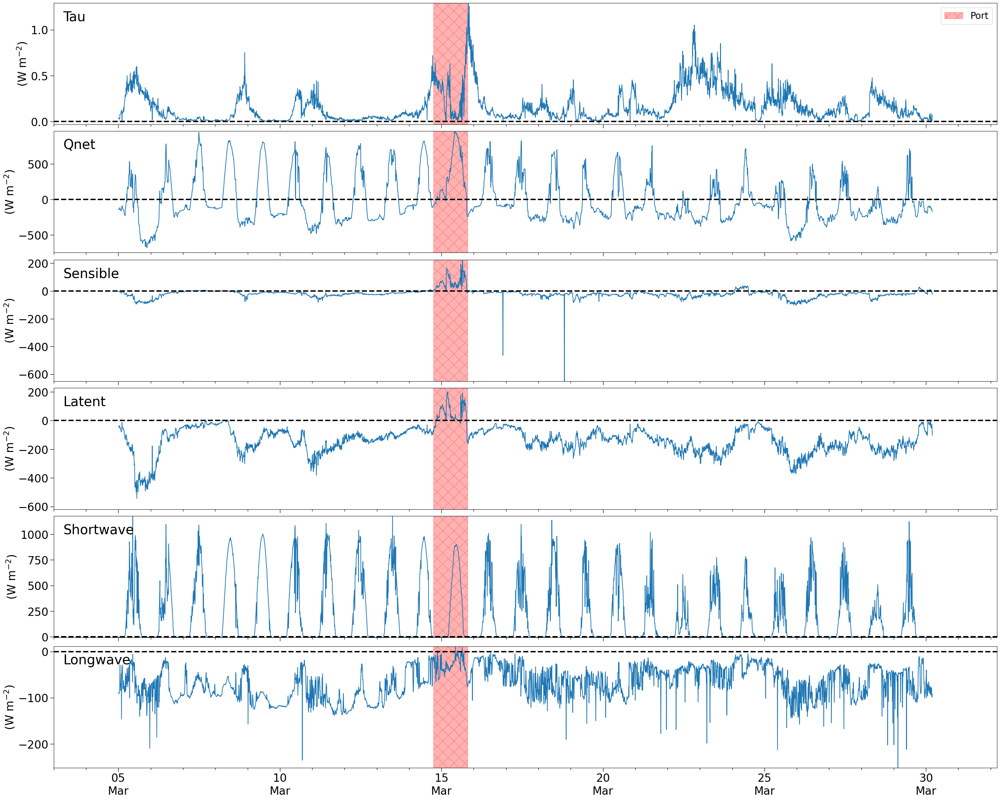

In [10]:
# Define a list of variables to plot
variables = ['tau', 'Qnet', 'sensible', 'latent', 'shortwave', 'longwave']

# Create a subplots layout with multiple axes for each variable
# Share the same x-axis to align the time values
fig, ax = plt.subplots(len(variables), 1, constrained_layout=True, figsize=(30, 4 * len(variables)), sharex=True)

# Loop through each axis and corresponding variable
for axs, var in zip(ax, variables):
    
    # Plot the data from the dataset
    axs.plot(ds.time.values, ds.isel(method=7)[var], zorder=2)
    
    # Set the title for each subplot
    axs.set_title(f"{var.capitalize()}", loc='left', y=0.83, x=0.01)
    
    # Set labels for the y-axis (with units) and the x-axis
    axs.set(ylabel=r"(W m$^{-2}$)", xlabel='', ylim=(np.nanpercentile(ds[var], 0.001), np.nanpercentile(ds[var], 99.999)))
    
    # Add a visual marker for port call intervals
    add_port_call(axs, 'r', ylim=axs.get_ylim())
    
    # Add a horizontal dashed line at y=0 for reference
    axs.axhline(0, lw=3, ls='--', c='k')

# Add a legend to the first subplot with 2 columns and a small font size
ax[0].legend(ncol=2, fontsize='small')

# Use the 'fix_xticks' function to adjust the x-axis ticks based on the 'ship' dataset
fix_xticks(ax, ship)


In [11]:
ds_day = ds.resample(time='1D').mean('time')
ds_6h = ds.resample(time='6H').mean('time')

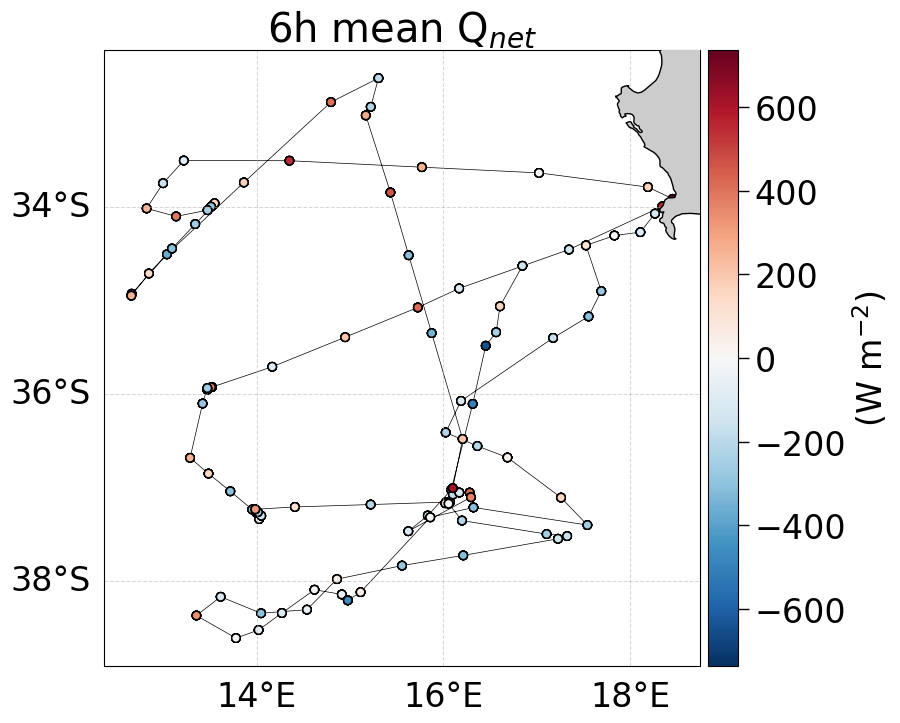

In [12]:
fig,ax = plt.subplots(figsize=(10,8),subplot_kw={'projection':ccrs.PlateCarree()})

ds_6h.plot.scatter(x='longitude',y='latitude', hue='Qnet',ec='k',zorder=2, cbar_kwargs=dict(label=r'(W m$^{-2}$)', pad=0.01))
ds_6h.set_coords('longitude')['latitude'].plot(x='longitude',zorder=1,c='k',lw=0.5)
ax.set(title='6h mean Q$_{net}$')

ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',facecolor='0.8',edgecolor='0'),zorder=3)
gridlines(ax,2,2)

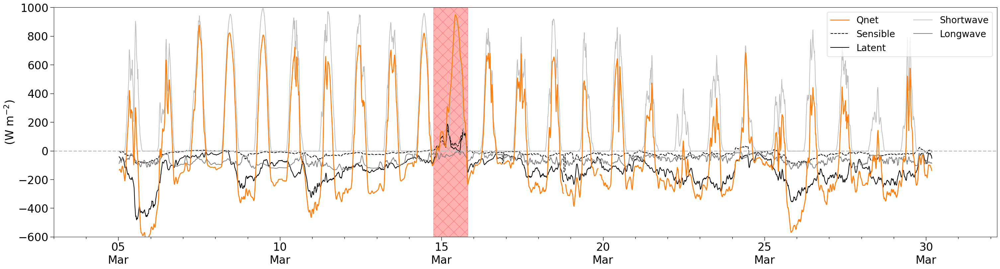

In [13]:
variables = ['tau','sensible','latent','shortwave','longwave']
fig,ax = plt.subplots(1,1,constrained_layout=True, figsize=(30,4*2))

ax.plot(ds.time.values,ds.isel(method=7)['Qnet'].rolling(time=6,center=True).mean('time'), zorder=3, label="Qnet", lw=2, c='C1')

for var,c,ls in zip(variables[1:],['0','0','0.75','0.5'],['--','-','-','-']): 

    ax.plot(ds.time.values,ds.isel(method=7)[var].rolling(time=6,center=True).mean('time'), zorder=2, label=f"{var.capitalize()}", lw=1.5, c=c,ls=ls)


ax.axhline(0,lw=2,ls='--',c='0.75')



ax.legend(ncol=2,fontsize='small')

ax.set(ylabel=r"(W m$^{-2}$)", xlabel='', ylim=(-600,1000))

add_port_call(ax,'r',ylim=(-600,1000))


fix_xticks([ax],ship)

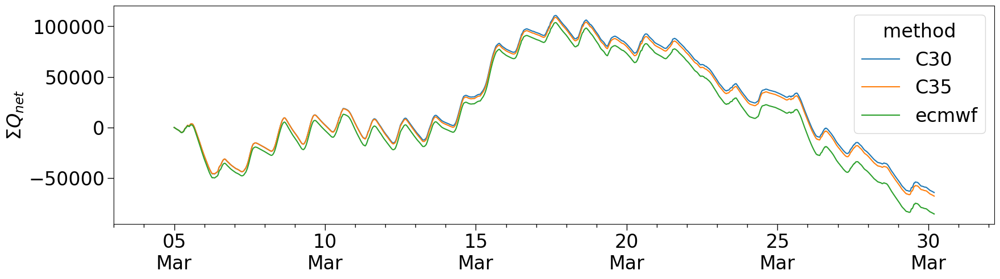

In [14]:
fig,ax = plt.subplots(figsize=(20,5))

np.cumsum(ds['Qnet'].isel(method=[6,7,8]),axis=0).plot(ax=ax,hue='method',add_legend=True)#,cbar_kwargs={'label':'$\Sigma Q_{net}$','pad':0.01},ax=ax)

ax.set(ylabel='$\Sigma Q_{net}$')
fix_xticks([ax],ds)

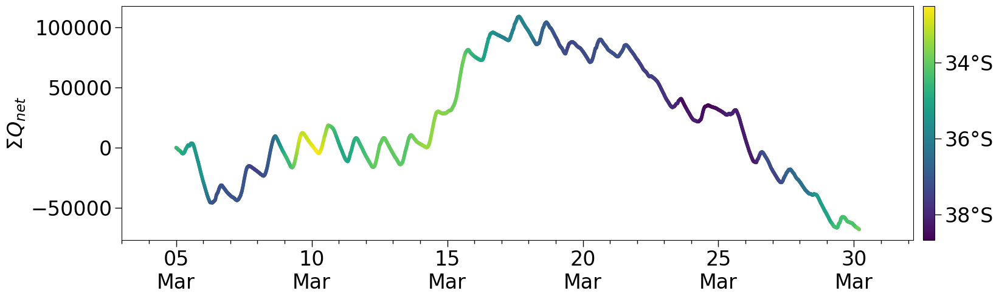

In [15]:
fig,ax = plt.subplots(figsize=(20,5))
sct = ax.scatter(ds.time.values,np.cumsum(ds['Qnet'].isel(method=7),axis=0),10,ds['latitude'])#, cmap='cmo.balance',vmin=-39,vmax=-33)
cb = plt.colorbar(sct,pad=0.01,aspect=20)
cb.ax.yaxis.set_major_formatter(LATITUDE_FORMATTER)


ax.set(ylabel='$\Sigma Q_{net}$')
fix_xticks([ax],ds)

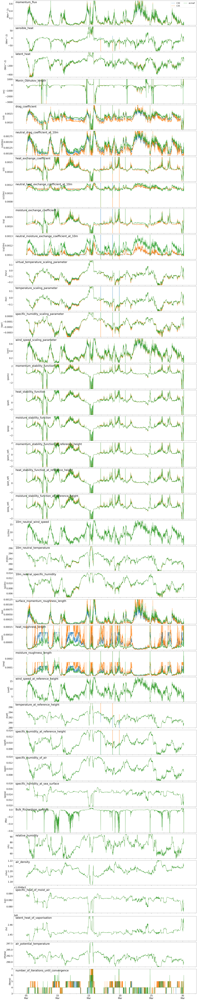

In [16]:
fig,ax = plt.subplots(len(outputs),1,constrained_layout=True, figsize=(30,4*len(outputs)), sharex=True)

for axs,var in zip(ax,outputs): 

    for i,meth in enumerate(ds.method.values[6:9]):
        axs.plot(ds.time.values,ds.isel(method=i+6)[var],label=meth, zorder=2)
    
    axs.set_title(f"{ds[var].attrs['name']}",loc='left',y=0.88, x=0.01)
    axs.set(ylabel=f"({ds[var].attrs['unit']})", xlabel='', ylim=(np.nanpercentile(ds[var],1),np.nanpercentile(ds[var],99)))

ax[0].legend(ncol=2,fontsize='small')
fix_xticks(ax,ship)

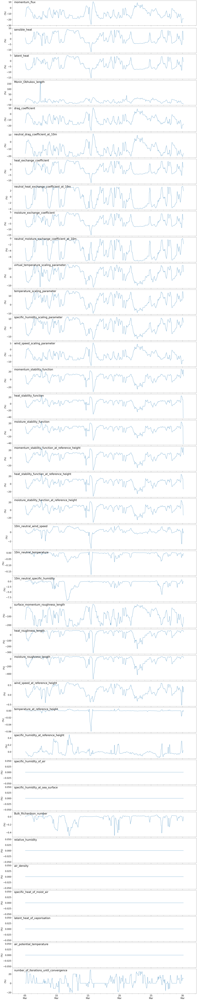

In [25]:
fig,ax = plt.subplots(len(outputs),1,constrained_layout=True, figsize=(30,4*len(outputs)), sharex=True)

for axs,var in zip(ax,outputs): 

    axs.plot(ds.time.resample(time='1H').mean('time').values,((ds.isel(method=7)[var].resample(time='1H').mean('time') - ds.isel(method=8)[var].resample(time='1H').mean('time'))/ds.isel(method=7)[var].resample(time='1H').mean('time')*100).rolling(time=3,center=True).median('time'), zorder=2)
    
    axs.set_title(f"{ds[var].attrs['name']}",loc='left',y=0.88, x=0.01)
    axs.set(ylabel="(%)", xlabel='')

fix_xticks(ax,ship)

In [18]:
pdiff = (ds.isel(method=7) - ds.isel(method=8))
rmse = ((pdiff**2).mean('time'))**(1/2)
bias = pdiff.mean('time')


In [19]:
print(rmse[['tau','sensible','latent','Qnet']])

<xarray.Dataset>
Dimensions:   ()
Data variables:
    tau       float64 0.0152
    sensible  float64 14.85
    latent    float64 9.778
    Qnet      float64 10.81


In [20]:
print(bias[['tau','sensible','latent','Qnet']])

<xarray.Dataset>
Dimensions:   ()
Data variables:
    tau       float64 -0.005558
    sensible  float64 -0.5057
    latent    float64 4.778
    Qnet      float64 4.608


In [21]:
print(ds.isel(method=7)[['tau','sensible','latent','Qnet']].mean('time'))

<xarray.Dataset>
Dimensions:   ()
Coordinates:
    method    <U8 'C35'
Data variables:
    tau       float64 0.1597
    sensible  float64 -19.7
    latent    float64 -132.8
    Qnet      float64 -18.76


In [22]:
print(ds.isel(method=8)[['tau','sensible','latent','Qnet']].mean('time'))

<xarray.Dataset>
Dimensions:   ()
Coordinates:
    method    <U8 'ecmwf'
Data variables:
    tau       float64 0.1652
    sensible  float64 -19.19
    latent    float64 -137.5
    Qnet      float64 -23.61


In [23]:
print(bias[['tau','sensible','latent','Qnet']]/ds.isel(method=7)[['tau','sensible','latent','Qnet']].mean('time')*100)

<xarray.Dataset>
Dimensions:   ()
Coordinates:
    method    <U8 'C35'
Data variables:
    tau       float64 -3.481
    sensible  float64 2.567
    latent    float64 -3.597
    Qnet      float64 -24.57


In [24]:
print(np.sum(ds.isel(method=7)['Qnet']))
print(np.sum(ds.isel(method=8)['Qnet']))

<xarray.DataArray 'Qnet' ()>
array(-67860.80087844)
Coordinates:
    method   <U8 'C35'
<xarray.DataArray 'Qnet' ()>
array(-85556.36718543)
Coordinates:
    method   <U8 'ecmwf'
